# PHASE 3 PROJECT: TELECOM CHURN PREDICTION
## BUSINESS UNDERSTANDING

### Overview
Customer churn is a critical challenge for SyriaTel, leading to revenue loss and increased customer acquisition costs.

Predicting churn helps retain existing customers more cost-effectively than acquiring new ones.



#### Challenges:
- **Pattern Identification:** Understanding factors like service quality and pricing.

- **Data Complexity:** Ensuring accuracy in large, diverse datasets.

- **Actionable Insights:** Translating predictions into effective retention strategies.



#### Stakeholders:
- **Business Executives:** Focus on ROI and strategic outcomes.

- **Customer Service Teams:** Use insights for proactive retention.

- **Data Science Team:** Develop and deploy predictive models.




### Problem Statement:
How can SyriaTel predict and reduce customer churn using historical data to improve customer retention and minimize revenue loss?




### Objectives:
1. Develop a machine learning model to predict customer churn.

2. Identify key factors contributing to churn.

3. Provide actionable insights to reduce churn rates.




### Metrics of Success:
- Accuracy Target: ≥ 85%

- Precision Target: ≥ 80%

- Additional Metrics: ROC-AUC, F1-scor

## DATA UNDERSTANDING

In [1]:
# Importing necessary libraries
import numpy as np 
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler
from sklearn.tree import DecisionTreeClassifier 
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
from sklearn.metrics import confusion_matrix, roc_curve, auc
from sklearn.preprocessing import OneHotEncoder
from sklearn import tree
from sklearn.model_selection import GridSearchCV

In [2]:
# load the dataset
df = pd.read_csv("bigml_59c28831336c6604c800002a.csv")

In [3]:
# Display basic information about the dataset
df_info = {
    "shape": df.shape,
    "info": df.info(),
    "head": df.head(),
    "description": df.describe()
}
df_info

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

{'shape': (3333, 21),
 'info': None,
 'head':   state  account length  area code phone number international plan  \
 0    KS             128        415     382-4657                 no   
 1    OH             107        415     371-7191                 no   
 2    NJ             137        415     358-1921                 no   
 3    OH              84        408     375-9999                yes   
 4    OK              75        415     330-6626                yes   
 
   voice mail plan  number vmail messages  total day minutes  total day calls  \
 0             yes                     25              265.1              110   
 1             yes                     26              161.6              123   
 2              no                      0              243.4              114   
 3              no                      0              299.4               71   
 4              no                      0              166.7              113   
 
    total day charge  ...  total eve ca

### Data Understanding Insights
**Dataset Details:**
- Rows (Observations): 3,333
- Columns (Features): 21
- Target Variable: *churn* (Boolean: True/False, indicating customer churn)

**Column Descriptions:**
  - **Categorical Features:**

     - *state:* Customer's state (e.g., KS, OH).
     - *phone number:* Phone number (likely irrelevant for prediction).
     - *international plan:* Whether the customer has an international calling plan (yes/no).
     - *voice mail plan:* Whether the customer has a voicemail plan (yes/no).
  - **Numerical Features:**

     - Call durations and charges for different times of day (total day minutes, total eve minutes, etc.).
     - Counts of calls/messages (total day calls, number vmail messages, etc.).
     - Number of customer service calls.
  - **Target Column:**

     - *churn:* Indicates whether the customer has churned.
**Initial Observations:**
1. The dataset has no missing values.
2. The *phone number* column is likely a unique identifier and not useful for modeling.
3. Features like *international plan* and *voice mail plan* are binary but stored as strings.
4. All numerical features, such as call duration, charges, and customer service calls, are well-formed.


## DATA CLEANING AND PREPARATION
1. **Clean Data:**

- Drop or encode irrelevant columns (e.g., phone number).
- Convert binary categorical variables (international plan, voice mail plan) into numeric.
2. **Visual Analysis:**

- Examine churn distribution (target imbalance).
- Create correlation heatmaps and other visuals for feature relationships.
3. **Split Data:**

- Separate data into training and testing sets.

### Data Cleaning

In [4]:
# Data Cleaning and Preparation

# Drop the irrelevant 'phone number' column
df_cleaned = df.drop(columns=["phone number"])

# Encode binary categorical variables("international plan" and "voice mail plan")
binary_mapping = {"yes": 1, "no": 0}
df_cleaned["international plan"] = df_cleaned["international plan"].map(binary_mapping)
df_cleaned["voice mail plan"] = df_cleaned["voice mail plan"].map(binary_mapping)

# Ensure target variable is numeric 
df_cleaned["churn"] = df_cleaned["churn"].astype(int)

# Summary of cleaned data
df_cleaned_info = {
    "head_cleaned": df_cleaned.head(),
    "data_types": df_cleaned.dtypes
}
df_cleaned_info

{'head_cleaned':   state  account length  area code  international plan  voice mail plan  \
 0    KS             128        415                   0                1   
 1    OH             107        415                   0                1   
 2    NJ             137        415                   0                0   
 3    OH              84        408                   1                0   
 4    OK              75        415                   1                0   
 
    number vmail messages  total day minutes  total day calls  \
 0                     25              265.1              110   
 1                     26              161.6              123   
 2                      0              243.4              114   
 3                      0              299.4               71   
 4                      0              166.7              113   
 
    total day charge  total eve minutes  total eve calls  total eve charge  \
 0             45.07              197.4               99

#### Missing Value Analysis:
Identifying and handling missing data is crucial for model performance.

In [5]:
# Checking for missing values
df = df_cleaned
missing_data = df.isnull().sum()
missing_percentage = (missing_data / len(df)) * 100
print(f"Missing Data:\n{missing_data}\n")
print(f"Percentage of Missing Data:\n{missing_percentage}\n")

Missing Data:
state                     0
account length            0
area code                 0
international plan        0
voice mail plan           0
number vmail messages     0
total day minutes         0
total day calls           0
total day charge          0
total eve minutes         0
total eve calls           0
total eve charge          0
total night minutes       0
total night calls         0
total night charge        0
total intl minutes        0
total intl calls          0
total intl charge         0
customer service calls    0
churn                     0
dtype: int64

Percentage of Missing Data:
state                     0.0
account length            0.0
area code                 0.0
international plan        0.0
voice mail plan           0.0
number vmail messages     0.0
total day minutes         0.0
total day calls           0.0
total day charge          0.0
total eve minutes         0.0
total eve calls           0.0
total eve charge          0.0
total night minutes     

### Exploratory Data Analysis
#### 1. Univariate Analysis
#### Distribution of Continuous Features

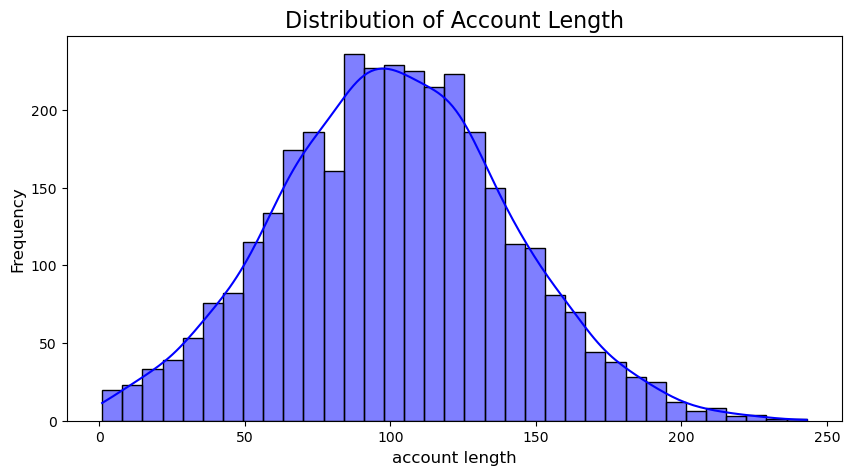

**Observations**

- The account length appears to have a normal distribution (Skewness = 0.10).


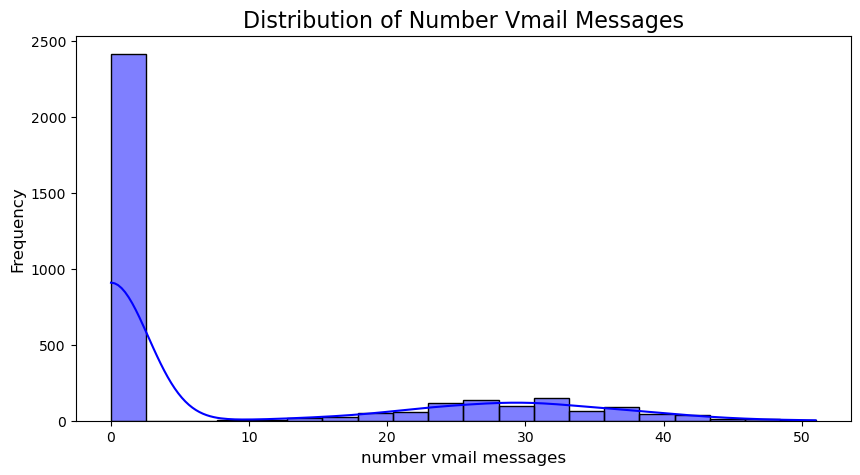

**Observations**

- The number vmail messages appears to have a skewed distribution (Skewness = 1.26).


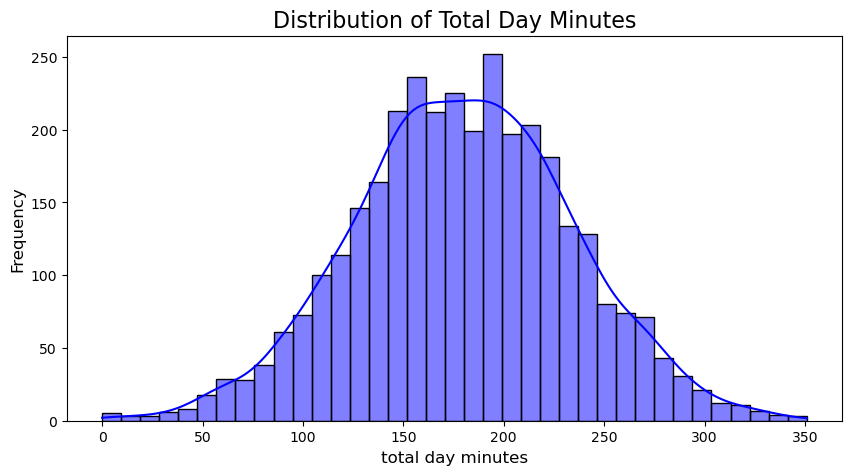

**Observations**

- The total day minutes appears to have a normal distribution (Skewness = -0.03).


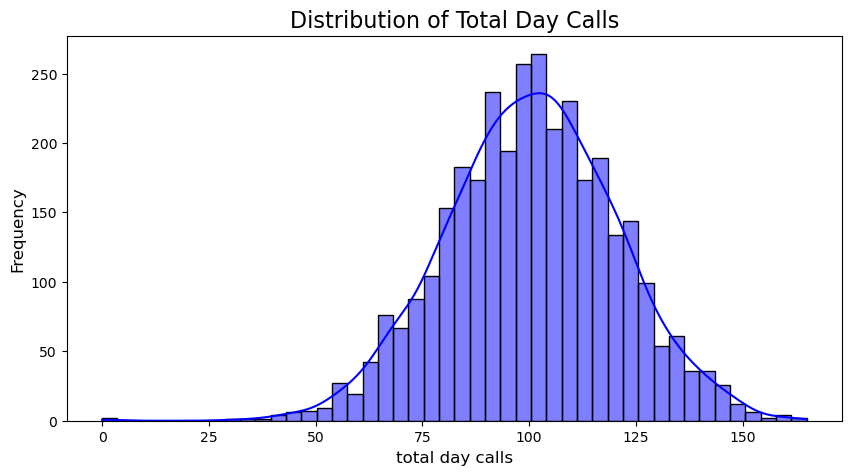

**Observations**

- The total day calls appears to have a normal distribution (Skewness = -0.11).


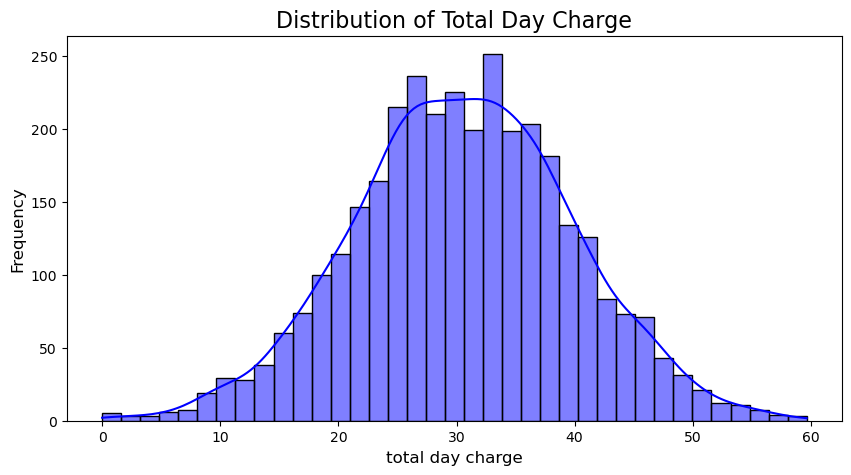

**Observations**

- The total day charge appears to have a normal distribution (Skewness = -0.03).


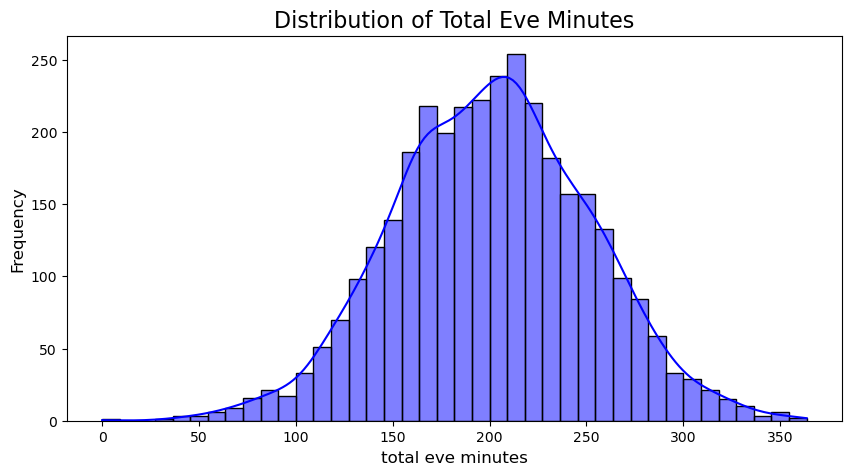

**Observations**

- The total eve minutes appears to have a normal distribution (Skewness = -0.02).


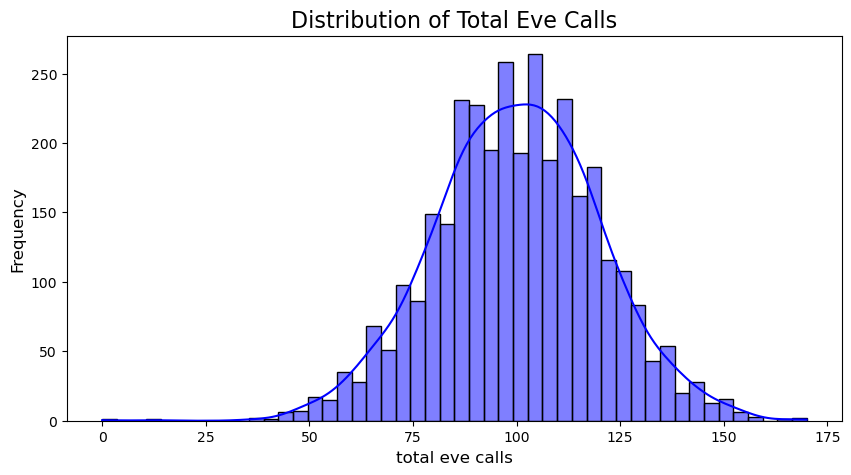

**Observations**

- The total eve calls appears to have a normal distribution (Skewness = -0.06).


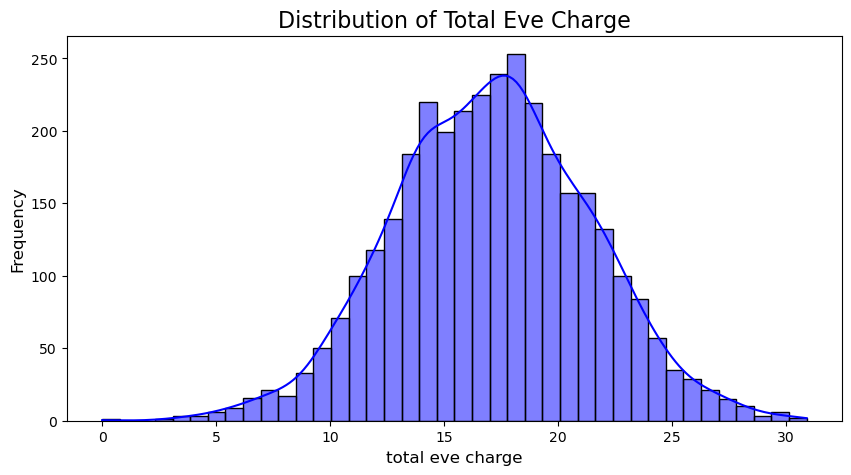

**Observations**

- The total eve charge appears to have a normal distribution (Skewness = -0.02).


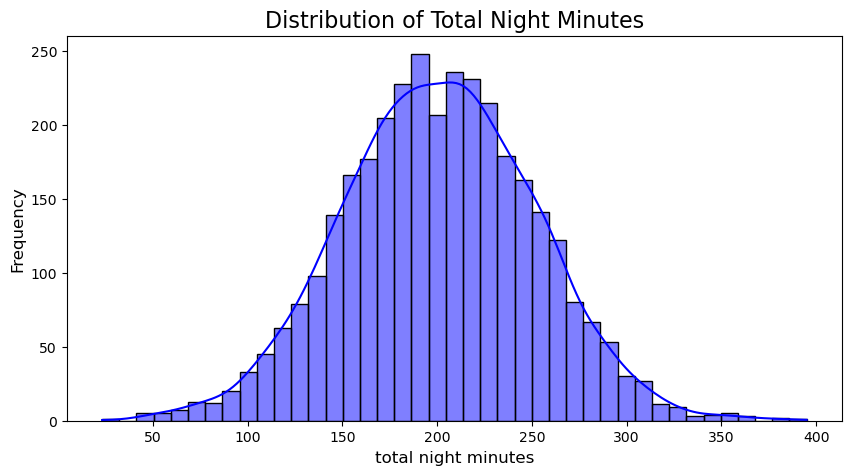

**Observations**

- The total night minutes appears to have a normal distribution (Skewness = 0.01).


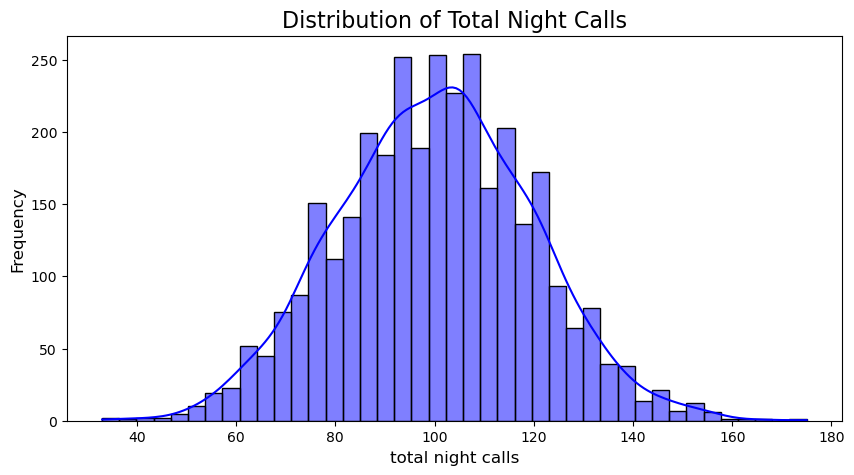

**Observations**

- The total night calls appears to have a normal distribution (Skewness = 0.03).


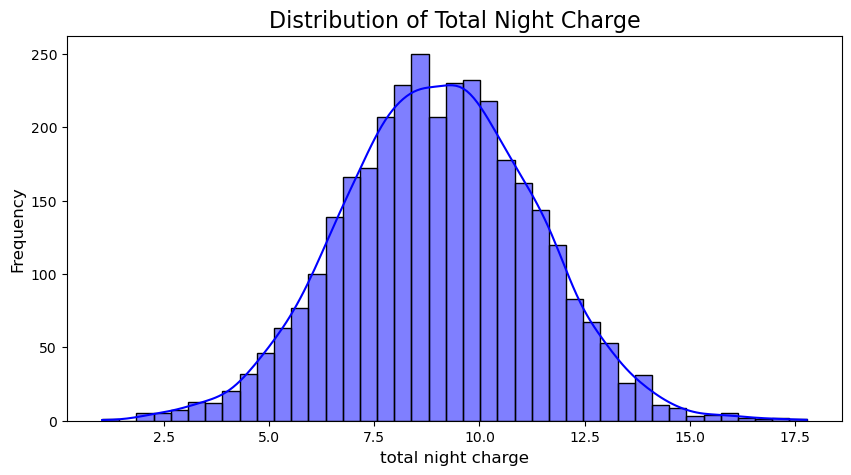

**Observations**

- The total night charge appears to have a normal distribution (Skewness = 0.01).


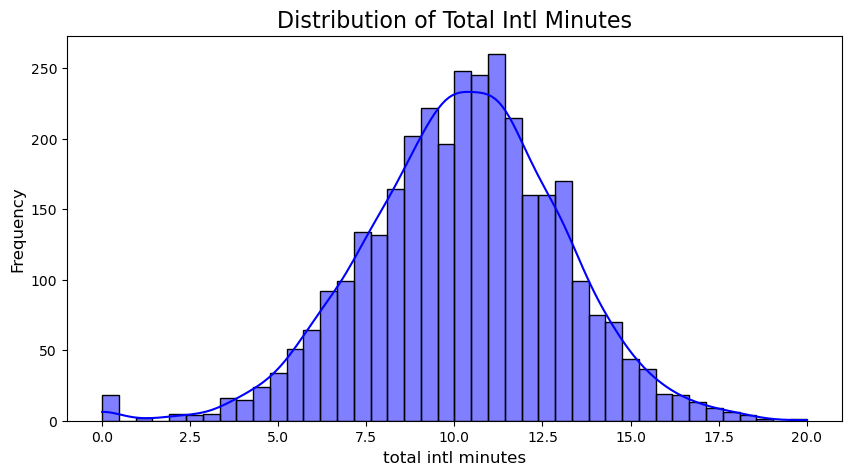

**Observations**

- The total intl minutes appears to have a normal distribution (Skewness = -0.25).


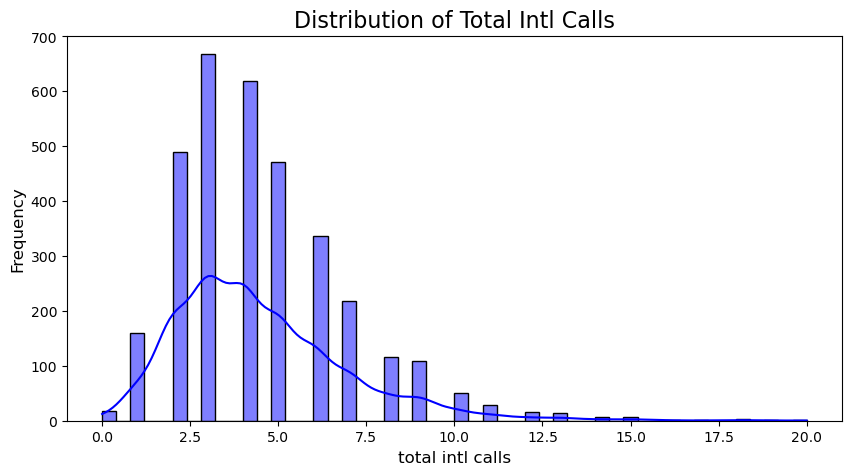

**Observations**

- The total intl calls appears to have a skewed distribution (Skewness = 1.32).


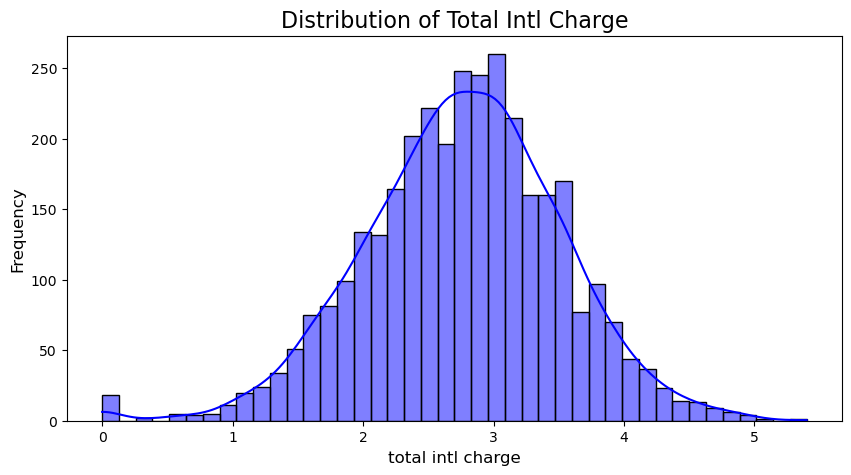

**Observations**

- The total intl charge appears to have a normal distribution (Skewness = -0.25).


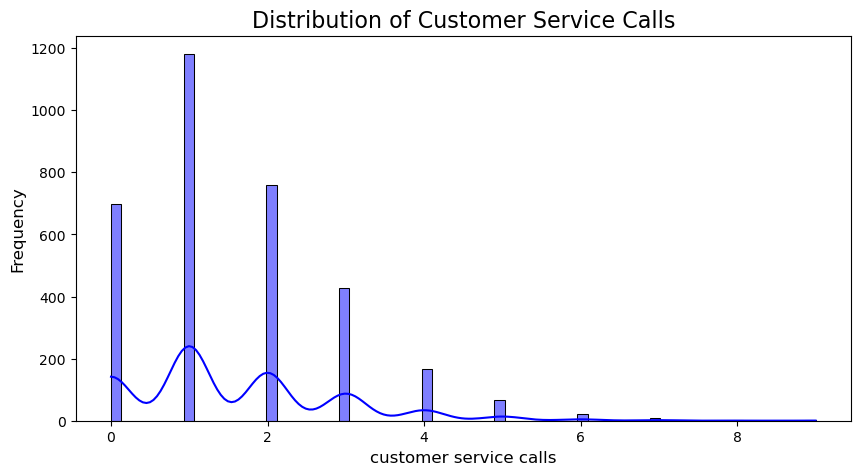

**Observations**

- The customer service calls appears to have a skewed distribution (Skewness = 1.09).


In [6]:
# Identify continuous numerical columns (excluding known categorical columns)
categorical_columns = ["state", "international plan", "voice mail plan", "area code", "churn"]
numerical_columns = [col for col in df.select_dtypes(include=["int64", "float64"]).columns if col not in categorical_columns]

# Visualizing numerical feature distributions
for col in numerical_columns:
    plt.figure(figsize=(10, 5))
    sns.histplot(df[col], kde=True, color="blue")
    plt.title(f"Distribution of {col.title()}", fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Frequency", fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()
    
    # Observation for the column
    display(Markdown("**Observations**"))

    skewness = df[col].skew()
    distribution_type = "skewed" if abs(skewness) > 0.5 else "normal"
    print(f"- The {col} appears to have a {distribution_type} distribution (Skewness = {skewness:.2f}).")

#### Categorical Features

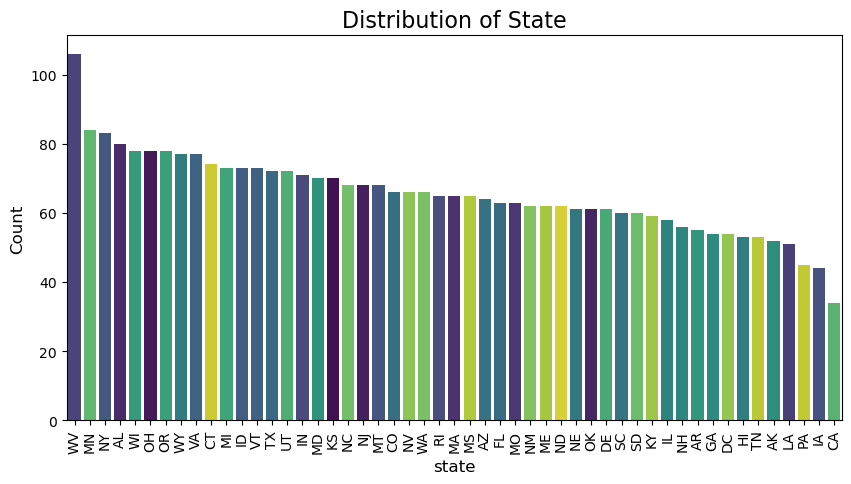

**Observation**

  - Distribution is relatively uniform across all states, with slight variations in customer counts.
  - States like WV and IA have higher customer counts compared to others.



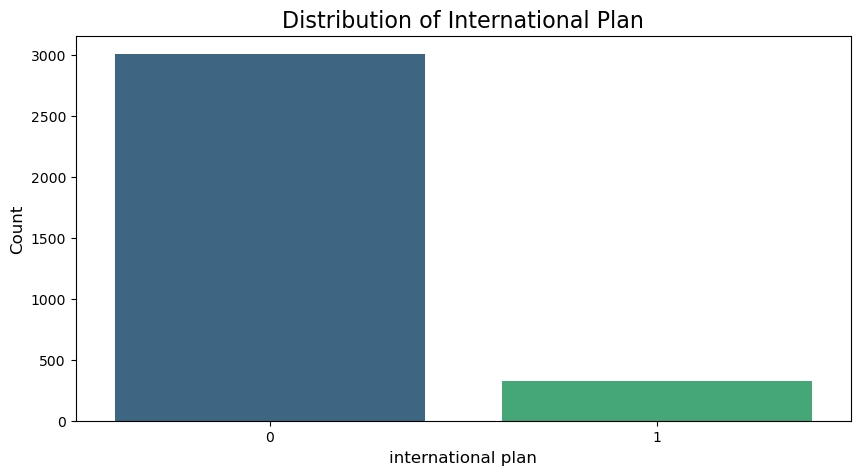

**Observation**

  - Most customers do not subscribe to the international plan (~90%).
  - Non-subscribers dominate, indicating potential low relevance unless linked to churn.



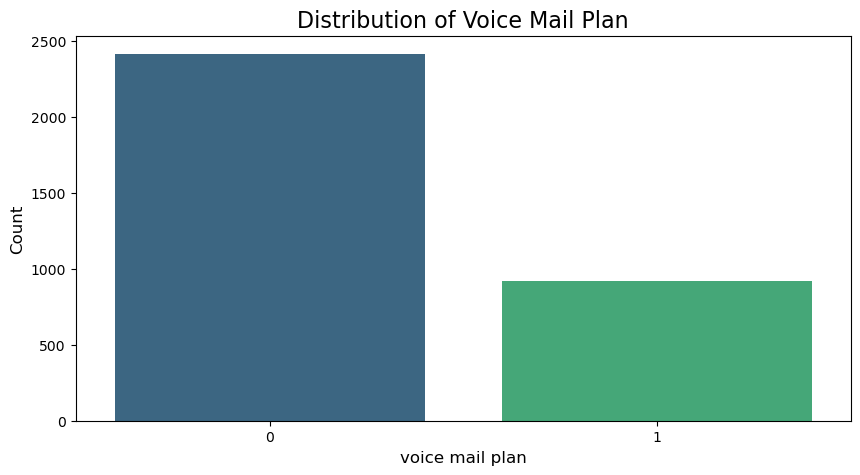

**Observation**

  - A majority of customers (~65%) do not have a voicemail plan.
  - This feature could be explored further for its impact on churn.



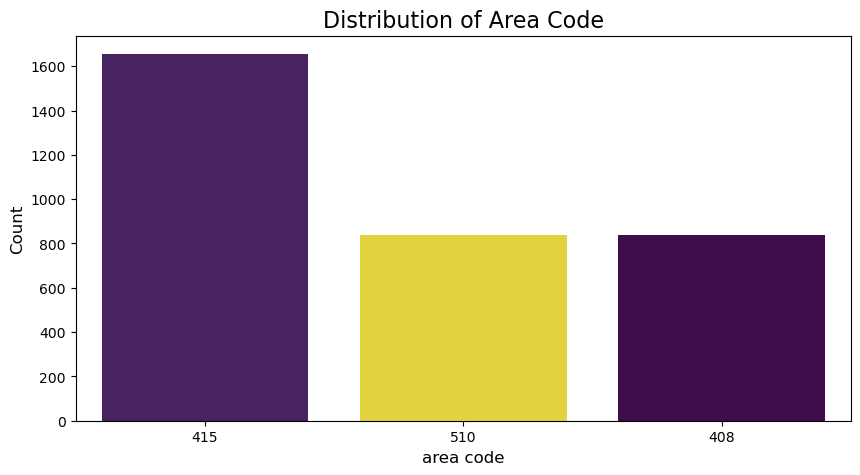

**Observation**

  - Customers are grouped into three distinct area codes (415, 408, 510).
  - Area code 415 has the highest customer count, but differences are minor.



In [7]:
# Categorical features for analysis
categorical_columns = ["state", "international plan", "voice mail plan", "area code"]

# Visualizing categorical feature distributions
for col in categorical_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(data=df, x=col, hue=col, palette="viridis", order=df[col].value_counts().index, legend=False)
    plt.title(f"Distribution of {col.title()}", fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(fontsize=10, rotation=90 if col == "state" else 0)
    plt.yticks(fontsize=10)
    plt.show()
    
    # Displaying observations in bold with customized summaries
    display(Markdown("**Observation**"))

    if col == "state":
        print("  - Distribution is relatively uniform across all states, with slight variations in customer counts.")
        print("  - States like WV and IA have higher customer counts compared to others.\n")
    elif col == "international plan":
        print("  - Most customers do not subscribe to the international plan (~90%).")
        print("  - Non-subscribers dominate, indicating potential low relevance unless linked to churn.\n")
    elif col == "voice mail plan":
        print("  - A majority of customers (~65%) do not have a voicemail plan.")
        print("  - This feature could be explored further for its impact on churn.\n")
    elif col == "area code":
        print("  - Customers are grouped into three distinct area codes (415, 408, 510).")
        print("  - Area code 415 has the highest customer count, but differences are minor.\n")

####  Churn Rate Analysis
- The distribution of churn is analyzed to understand the target variable's imbalance.

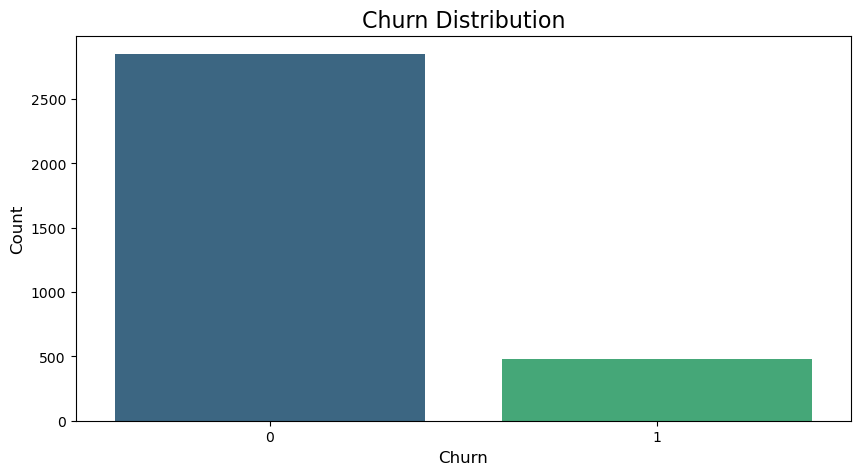

**Observations**

483 customers have churned, which represents 14.49% of the total 3333 customers, for which it confirms class imbalance.


In [8]:
# Churn rate distribution
plt.figure(figsize=(10, 5))
sns.countplot(data=df, x="churn", hue="churn", palette="viridis", legend=False)
plt.title("Churn Distribution", fontsize=16)
plt.xlabel("Churn", fontsize=12)
plt.ylabel("Count", fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.show()

# Observation
churn_counts = df["churn"].value_counts()
churned_count = churn_counts.iloc[1]
total_count = churn_counts.sum()
churn_rate = (churned_count / total_count) * 100

display(Markdown("**Observations**"))

print (f"{churned_count} customers have churned, which represents {churn_rate:.2f}% of the total {total_count} customers, for which it confirms class imbalance.")

#### 2. Bivariate Analysis
#### a) Comparing continuous variables with churn

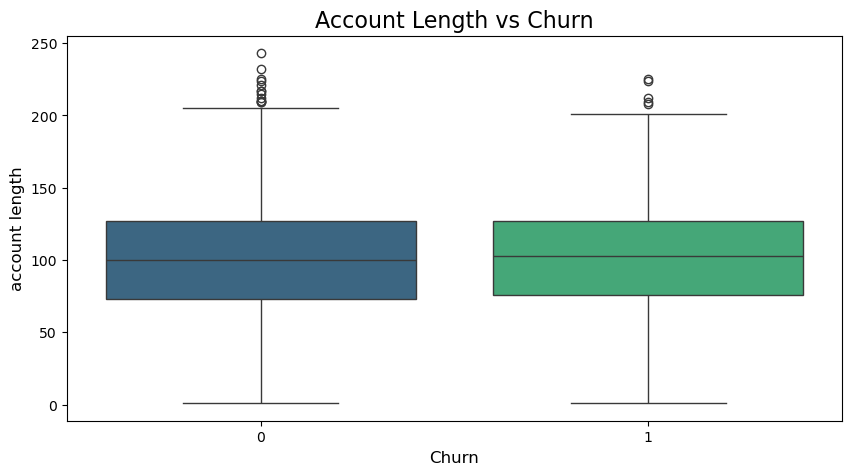

**Observations**

The distribution of account length appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of account length.




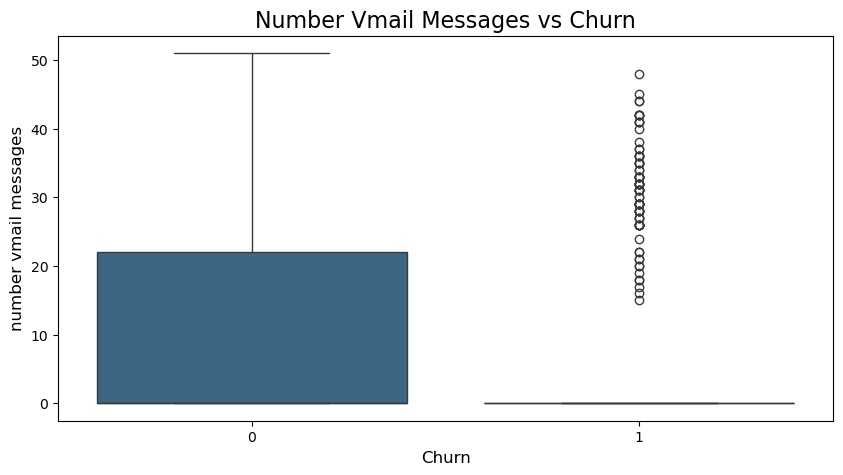

**Observations**

The distribution of number vmail messages appears to differ between churned and non-churned customers.
  - Non-churned customers tend to have higher values of number vmail messages.




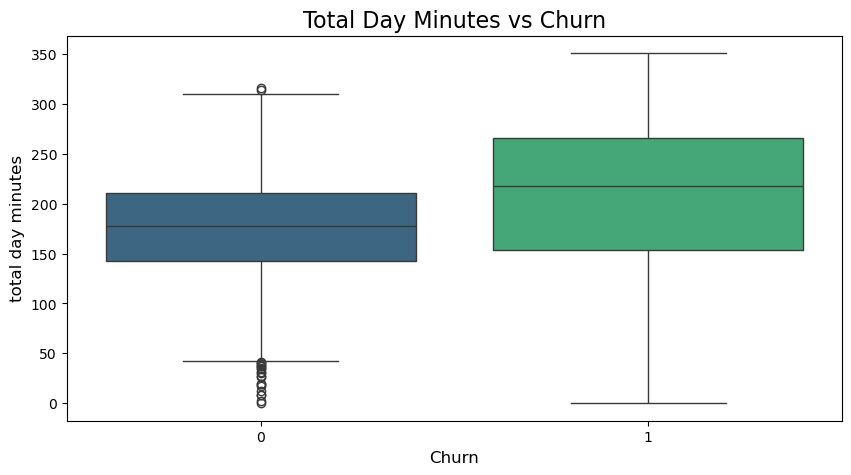

**Observations**

The distribution of total day minutes appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total day minutes.




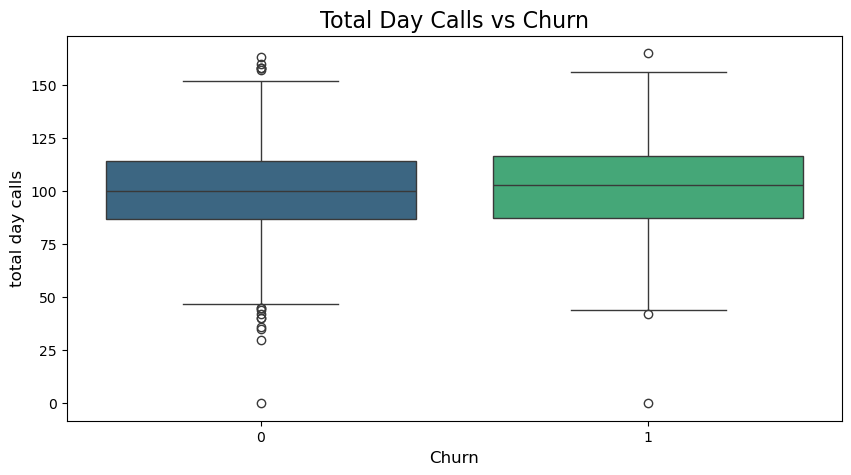

**Observations**

The distribution of total day calls appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total day calls.




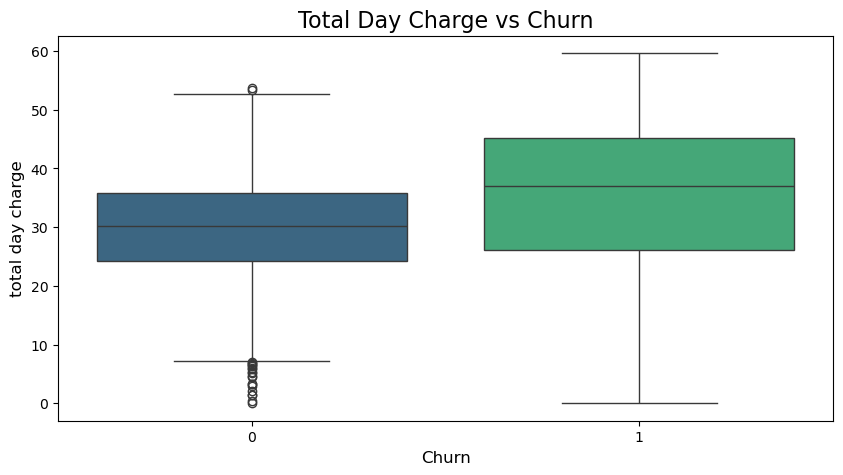

**Observations**

The distribution of total day charge appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total day charge.




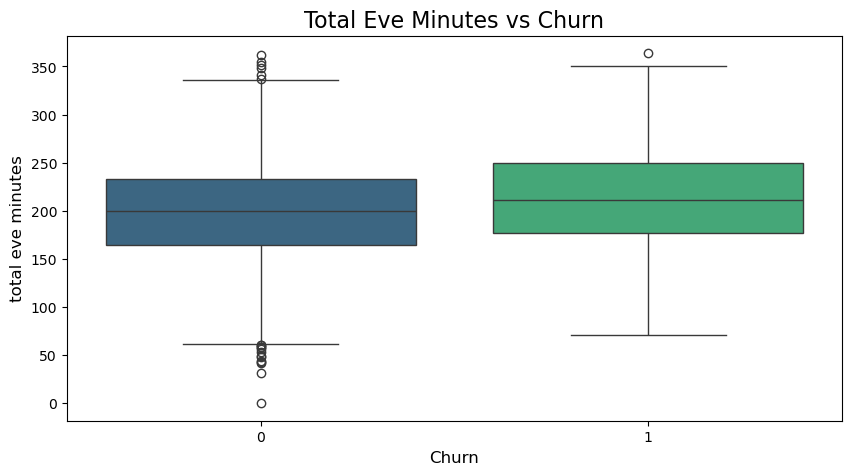

**Observations**

The distribution of total eve minutes appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total eve minutes.




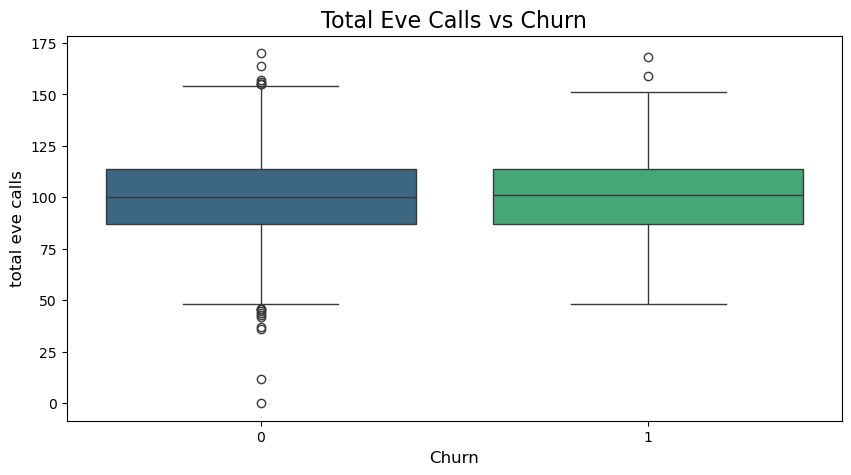

**Observations**

The distribution of total eve calls appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total eve calls.




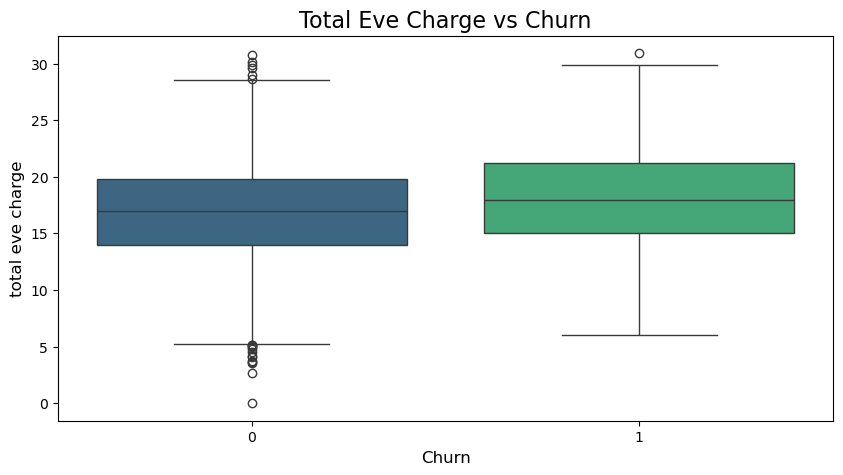

**Observations**

The distribution of total eve charge appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total eve charge.




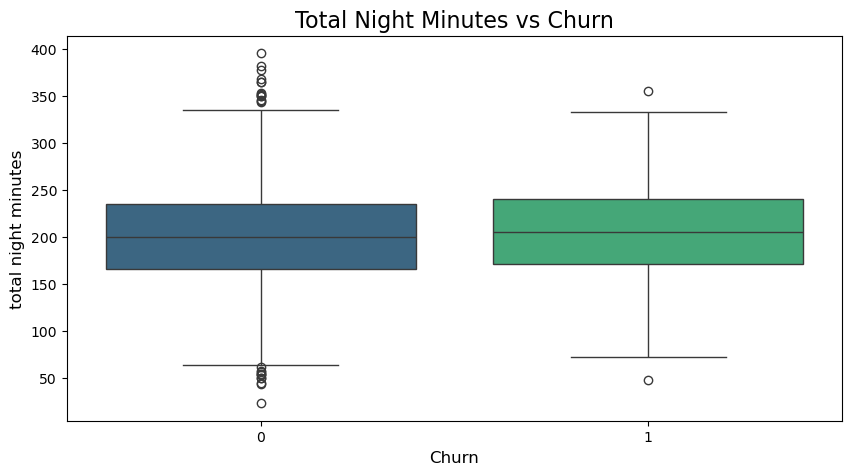

**Observations**

The distribution of total night minutes appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total night minutes.




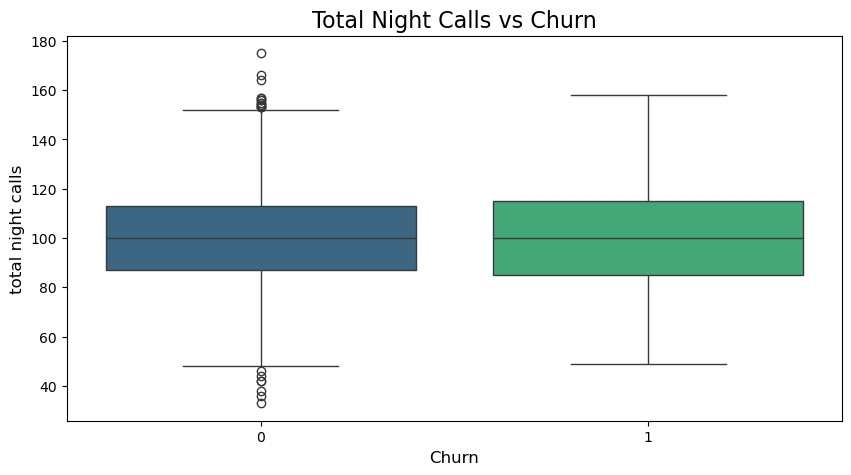

**Observations**

The distribution of total night calls appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total night calls.




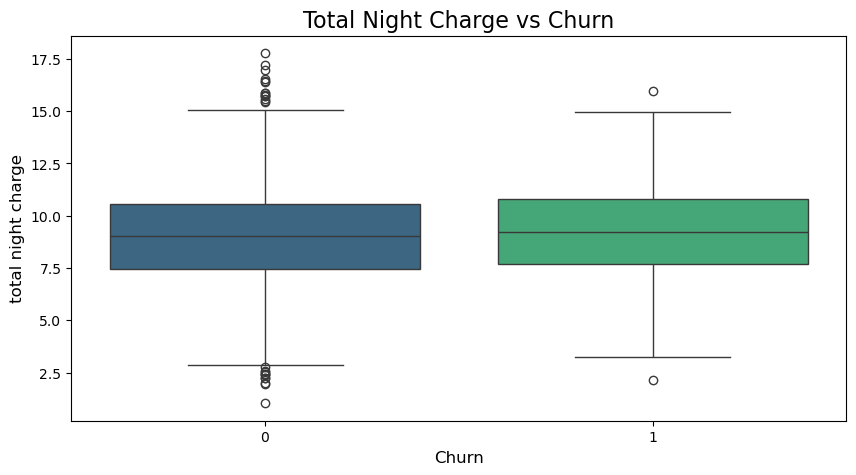

**Observations**

The distribution of total night charge appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total night charge.




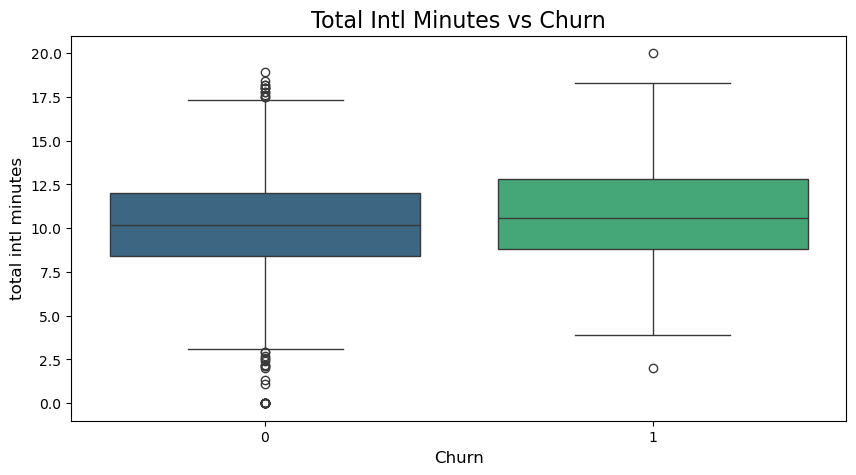

**Observations**

The distribution of total intl minutes appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total intl minutes.




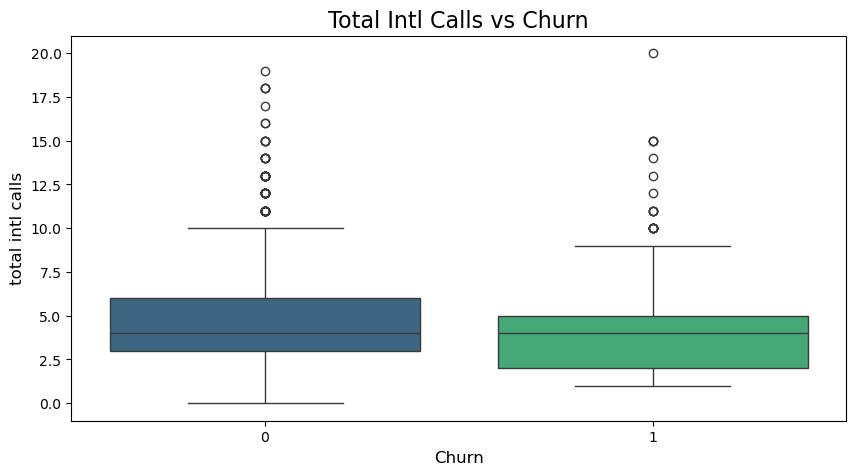

**Observations**

The distribution of total intl calls appears to differ between churned and non-churned customers.
  - Non-churned customers tend to have higher values of total intl calls.




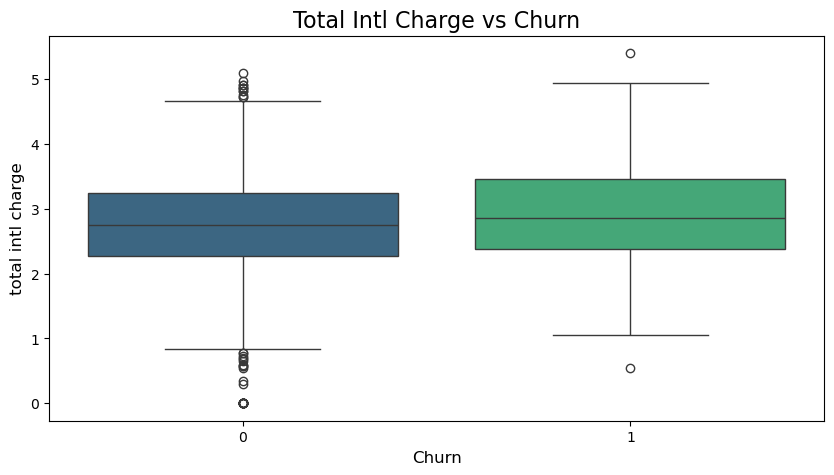

**Observations**

The distribution of total intl charge appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of total intl charge.




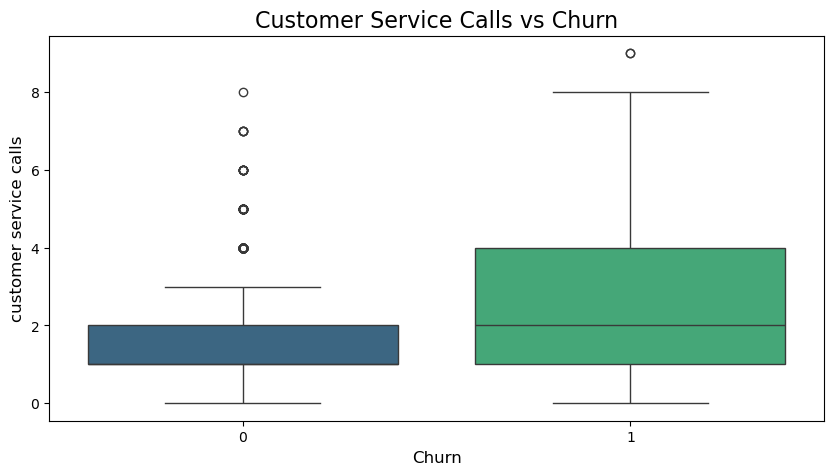

**Observations**

The distribution of customer service calls appears to differ between churned and non-churned customers.
  - Churned customers tend to have higher values of customer service calls.




In [9]:
# Visualizing relationship between continuous features and churn
for col in numerical_columns:
    plt.figure(figsize=(10, 5))
    sns.boxplot(data=df, x="churn", y=col, hue="churn", palette="viridis", legend=False)
    plt.title(f"{col.title()} vs Churn", fontsize=16)
    plt.xlabel("Churn", fontsize=12)
    plt.ylabel(col, fontsize=12)
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    plt.show()
    
    # Observations
    display(Markdown("**Observations**"))

    print(f"The distribution of {col} appears to differ between churned and non-churned customers.")
    if df[df["churn"] == 1][col].mean() > df[df["churn"] == 0][col].mean():
        print(f"  - Churned customers tend to have higher values of {col}.")
    else:
        print(f"  - Non-churned customers tend to have higher values of {col}.")
    print("\n")

#### b) Categorical Features by Churn

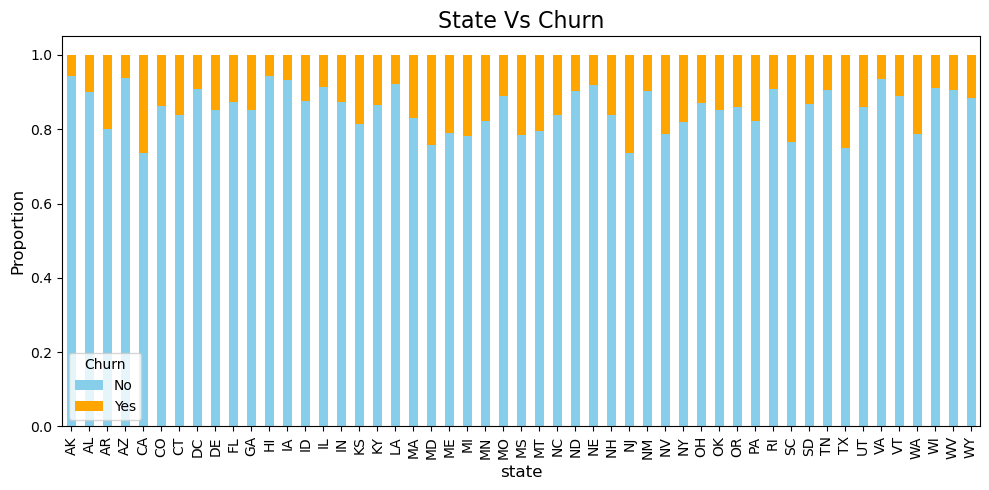

**Observations**

  - The distribution of churn varies across state.
  - Significant variation in churn rates is observed among the state categories.




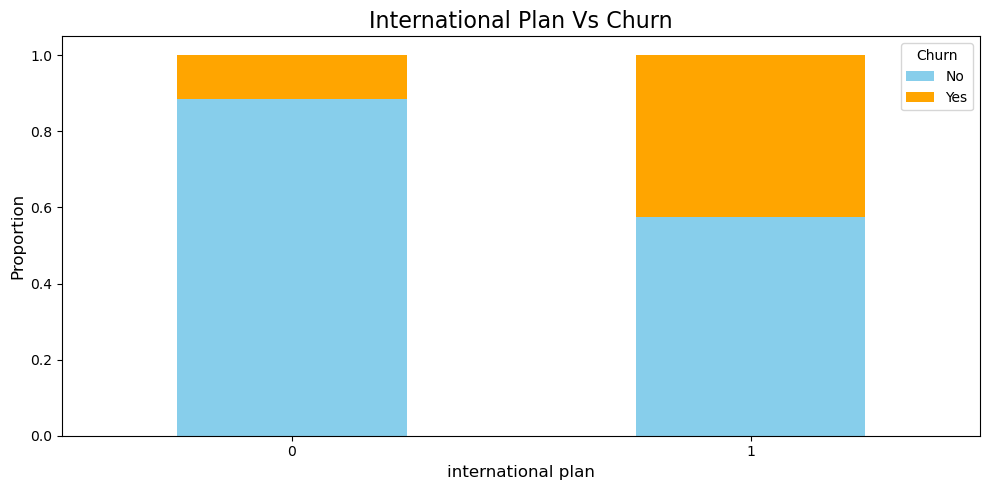

**Observations**

  - The distribution of churn varies across international plan.
  - Significant variation in churn rates is observed among the international plan categories.




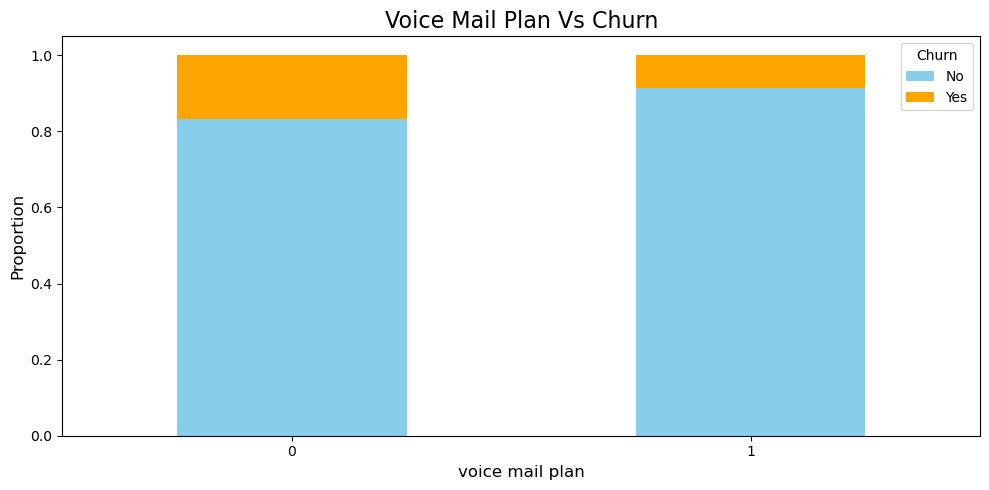

**Observations**

  - The distribution of churn varies across voice mail plan.
  - Minimal variation in churn rates is observed among the voice mail plan categories.




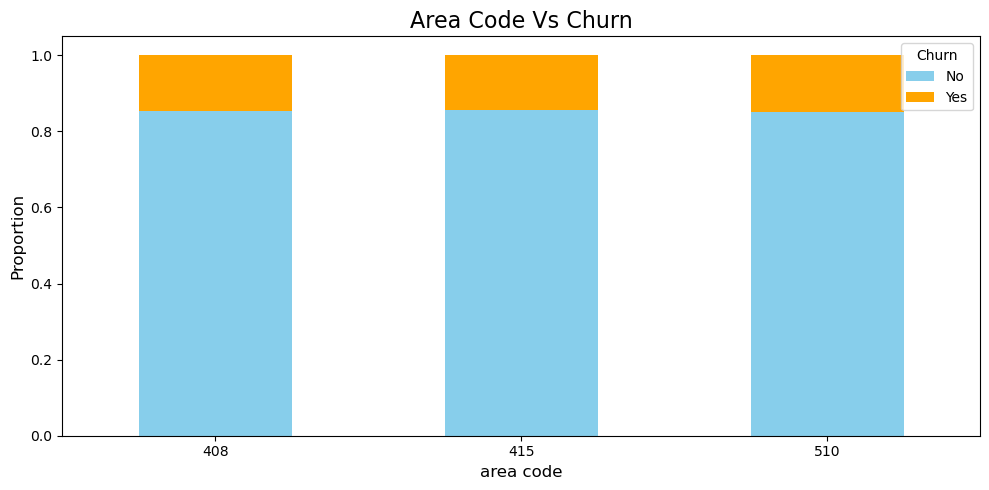

**Observations**

  - The distribution of churn varies across area code.
  - Minimal variation in churn rates is observed among the area code categories.




In [10]:
# Bivariate analysis for categorical features by churn
categorical_columns = ["state", "international plan", "voice mail plan", "area code"]

for col in categorical_columns:
    plt.figure(figsize=(10, 5))
    churn_crosstab = pd.crosstab(df[col], df["churn"], normalize="index")
    churn_crosstab.plot(kind="bar", stacked=True, color=["skyblue", "orange"], ax=plt.gca())
    plt.title(f"{col.title()} Vs Churn", fontsize=16)
    plt.xlabel(col, fontsize=12)
    plt.ylabel("Proportion", fontsize=12)
    plt.xticks(fontsize=10, rotation=90 if col == "state" else 0)
    plt.yticks(fontsize=10)
    plt.legend(title="Churn", labels=["No", "Yes"], fontsize=10)
    plt.tight_layout()
    plt.show()

    # Observations
    display(Markdown("**Observations**"))
    print(f"  - The distribution of churn varies across {col}.")
    
    # Automatically detect the churn column for "Yes"
    churn_key = [key for key in churn_crosstab.columns if key in [1, "1", True]]
    if churn_key:
        churn_diff = churn_crosstab[churn_key[0]].max() - churn_crosstab[churn_key[0]].min()
        if churn_diff > 0.1:
            print(f"  - Significant variation in churn rates is observed among the {col} categories.")
        else:
            print(f"  - Minimal variation in churn rates is observed among the {col} categories.")
    else:
        print("  - Unable to detect churn column for analysis.")
    print("\n")

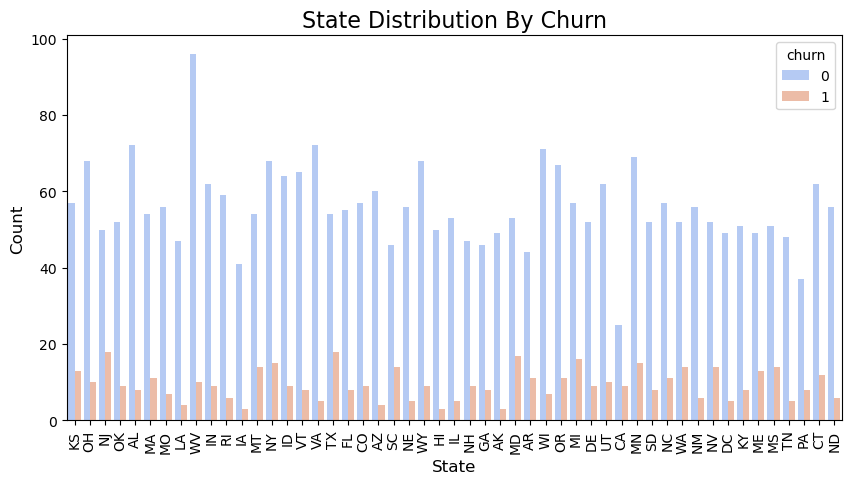

**Observations**

Customers in different state categories churn at rates: {'AK': 0.057692307692307696, 'AL': 0.1, 'AR': 0.2, 'AZ': 0.0625, 'CA': 0.2647058823529412, 'CO': 0.13636363636363635, 'CT': 0.16216216216216217, 'DC': 0.09259259259259259, 'DE': 0.14754098360655737, 'FL': 0.12698412698412698, 'GA': 0.14814814814814814, 'HI': 0.05660377358490566, 'IA': 0.06818181818181818, 'ID': 0.1232876712328767, 'IL': 0.08620689655172414, 'IN': 0.1267605633802817, 'KS': 0.18571428571428572, 'KY': 0.13559322033898305, 'LA': 0.0784313725490196, 'MA': 0.16923076923076924, 'MD': 0.24285714285714285, 'ME': 0.20967741935483872, 'MI': 0.2191780821917808, 'MN': 0.17857142857142858, 'MO': 0.1111111111111111, 'MS': 0.2153846153846154, 'MT': 0.20588235294117646, 'NC': 0.16176470588235295, 'ND': 0.0967741935483871, 'NE': 0.08196721311475409, 'NH': 0.16071428571428573, 'NJ': 0.2647058823529412, 'NM': 0.0967741935483871, 'NV': 0.21212121212121213, 'NY': 0.18072289156626506, 'OH': 0.1282051282051282, 'OK': 0.14754098360655737,

In [11]:
# Bar plot for categorical features by Churn
categorical_columns = df.select_dtypes(include=["object"]).columns

for col in categorical_columns:
    plt.figure(figsize=(10, 5))
    sns.countplot(x=col, hue="churn", data=df, palette="coolwarm")
    plt.title(f"{col.title()} Distribution By Churn", fontsize=16)
    plt.xlabel(col.title(), fontsize=12)
    plt.ylabel("Count", fontsize=12)
    plt.xticks(fontsize=10, rotation=90)
    plt.yticks(fontsize=10)
    plt.legend(title="churn", fontsize=10)
    plt.show()
    
    # Observation
    display(Markdown("**Observations**"))
    churn_ratio = df.groupby(col)["churn"].mean()
    print(f"Customers in different {col} categories churn at rates: {churn_ratio.to_dict()}.")

#### 3. Multivariate Analysis
#### a) Correlation heatmap
- Visualize a correlation heatmap, which will help in detecting relationships among numerical features.

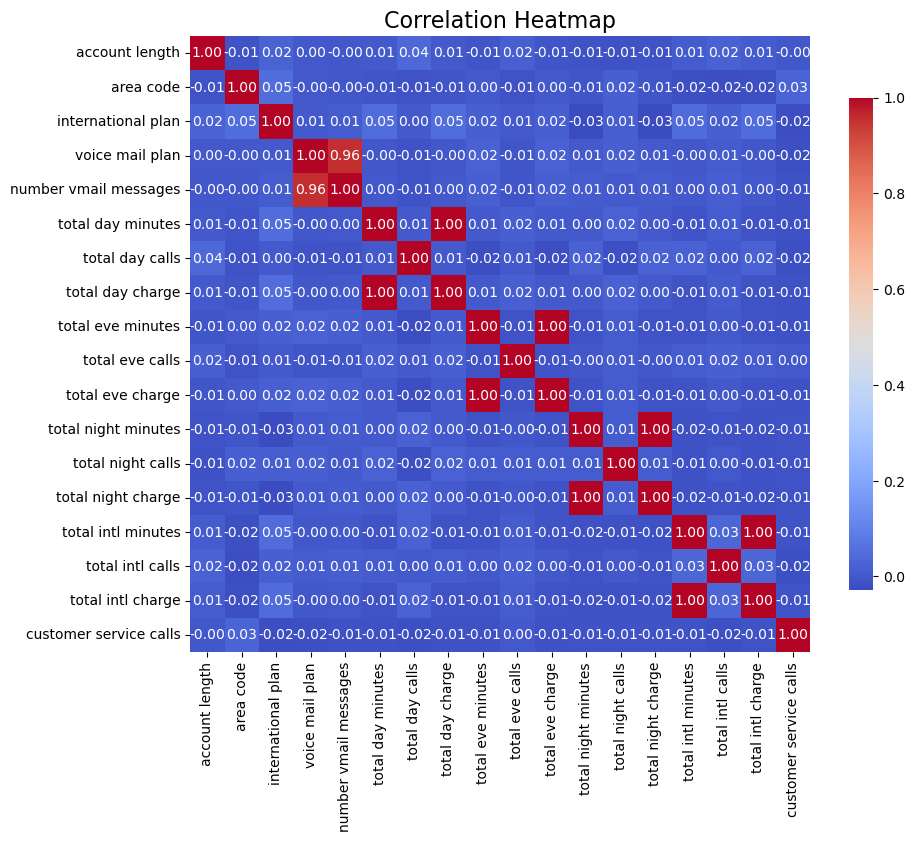

**Observations**

The highest correlations are observed between [('total day minutes', 'total day charge'), ('total day charge', 'total day minutes'), ('total eve minutes', 'total eve charge')].


In [12]:
# Ensure only numeric columns are selected
df_numeric = df.select_dtypes(include=["int64", "float64"])

# Correlation heatmap
plt.figure(figsize=(10, 8))
correlation_matrix = df_numeric.corr()      # Compute correlation on numeric data
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f", cbar_kws={"shrink": 0.8})
plt.title("Correlation Heatmap", fontsize=16)
plt.xticks(fontsize=10, rotation=90)
plt.yticks(fontsize=10)
plt.show()

# Observation on highest correlations
display(Markdown("**Observations**"))
high_corr_features = correlation_matrix.abs().unstack().sort_values(kind="quicksort", ascending=False)
high_corr_features = high_corr_features[high_corr_features < 1].head(3)
print(f"The highest correlations are observed between {list(high_corr_features.index[:3])}.")

#### b)Pair Plot (Continuous Features vs. Churn)

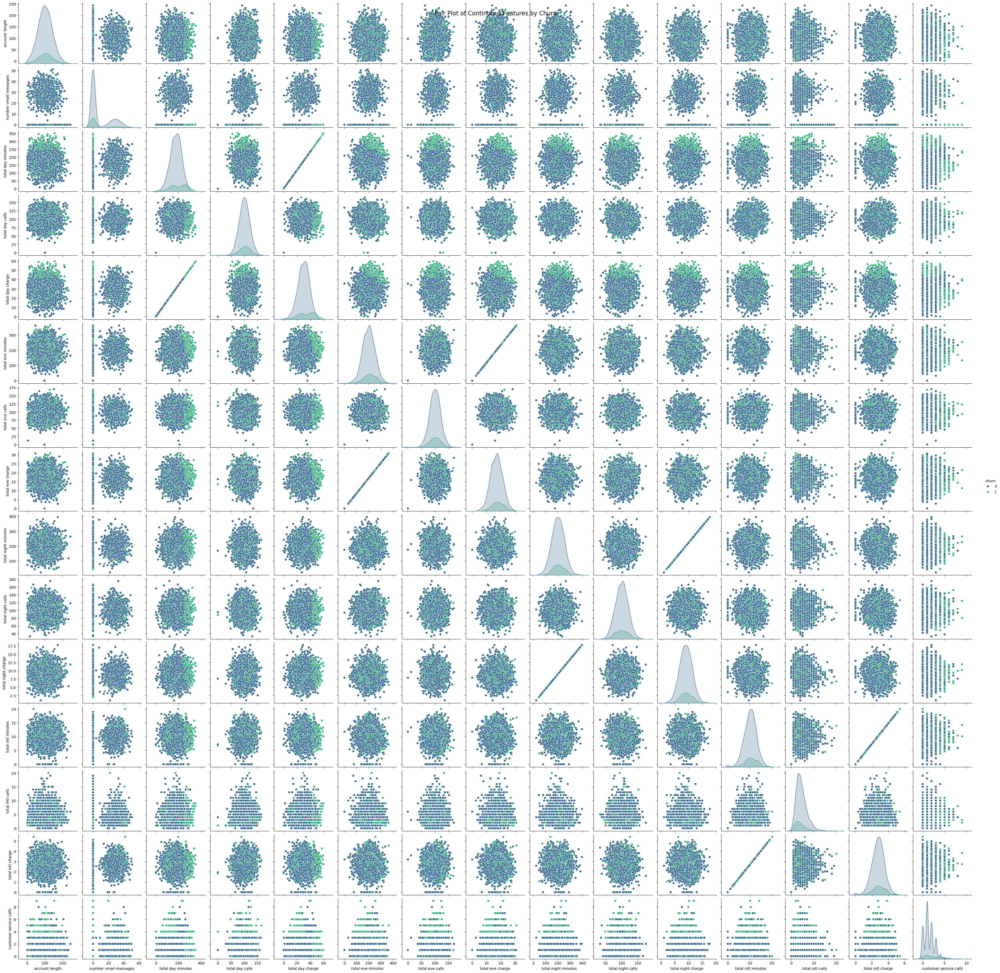

**Observations**

The pair plot helps visualize the relationships between multiple continuous variables and churn. For example, 'monthly charges' might show clustering by churn status.


In [13]:
# Pair plot between continuous features and churn
sns.pairplot(df, hue="churn", vars=numerical_columns, palette="viridis")
plt.suptitle("Pair Plot of Continuous Features by Churn", fontsize=16)
plt.show()

# Observation
display(Markdown("**Observations**"))
print("The pair plot helps visualize the relationships between multiple continuous variables and churn. For example, 'monthly charges' might show clustering by churn status.")

#### c) GroupBy Analysis for Categorical and Churn

In [14]:
# Grouping by categorical variables and calculating mean of numerical features
grouped = df.groupby("churn")[["state", "international plan", "voice mail plan", "area code"]].agg(lambda x: x.value_counts().index[0])
print(grouped)

# Observation
display(Markdown("**Observations**"))
print("GroupBy analysis allows us to see the most common values of categorical features for churned vs. non-churned customers. For instance, we might find that non-churned customers are more likely to have a voicemail plan.")

      state  international plan  voice mail plan  area code
churn                                                      
0        WV                   0                0        415
1        NJ                   0                0        415


**Observations**

GroupBy analysis allows us to see the most common values of categorical features for churned vs. non-churned customers. For instance, we might find that non-churned customers are more likely to have a voicemail plan.


## MODELING
For this classification problem, we’ll use the following models:

- **Baseline Model:** Logistic Regression (basic, no tuning).
- **Second Model:** Decision Tree Classifier (basic model).
- **Third Model:** Tuned Decision Tree Classifier.

#### Data Preprocessing (Feature Selection and Split)

In [15]:
# Handling categorical variables (encoding)
df_encoded = pd.get_dummies(df, drop_first=True)

# Splitting data into features and target variable
X = df_encoded.drop("churn", axis=1)
y = df_encoded["churn"]

# Splitting data into training and testing sets (80% training, 20% testing)
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

### 1. Baseline Model (Logistic Regression)

Logistic Regression Accuracy: 0.86
Logistic Regression Precision: 0.58
Logistic Regression Recall: 0.21
Logistic Regression F1-Score: 0.31
              precision    recall  f1-score   support

           0       0.87      0.97      0.92       566
           1       0.58      0.21      0.31       101

    accuracy                           0.86       667
   macro avg       0.73      0.59      0.61       667
weighted avg       0.83      0.86      0.83       667



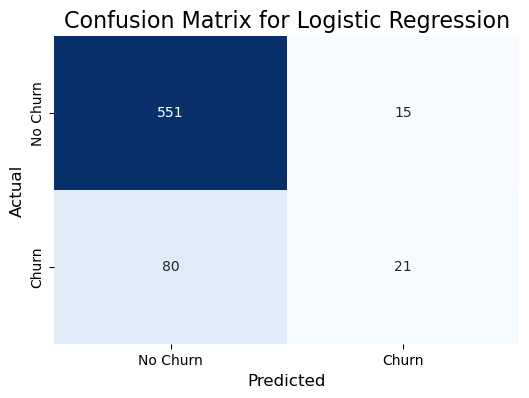

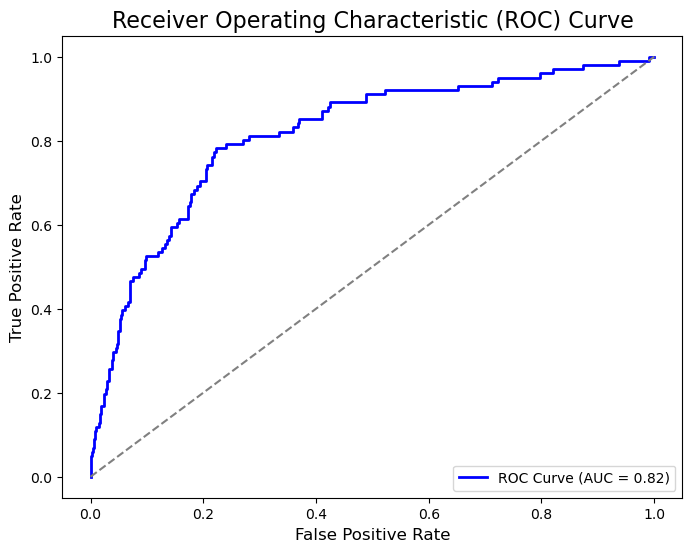

**Observations and Findings**

1. Logistic Regression Accuracy: 0.86
   - The accuracy of the model is 85.76%, indicating how well the model is classifying both churned and non-churned customers.
2. Logistic Regression Precision: 0.58
   - The precision of the model is 58.33%, which means that of all the customers predicted to churn, 58.33% actually did churn.
3. Logistic Regression Recall: 0.21
   - The recall of the model is 20.79%, indicating how well the model identifies actual churned customers.
4. Logistic Regression F1-Score: 0.31
   - The F1-score is 0.31, which is the harmonic mean of precision and recall.
5. Confusion Matrix: The confusion matrix reveals the following:
   - True Positives (TP): 21 - Churned customers correctly predicted.
   - True Negatives (TN): 551 - Non-churned customers correctly predicted.
   - False Positives (FP): 15 - Non-churned customers wrongly predicted as churned.
   - False Negatives (FN): 80 - Churned customers wrongly predicted as non-churned.
6. ROC Curve: The ROC curve sh

In [16]:
# Scale the features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Logistic Regression Model (Baseline)
logreg = LogisticRegression(max_iter=3333, random_state=42)
logreg.fit(X_train_scaled, y_train)
y_pred_logreg = logreg.predict(X_test_scaled)

# Evaluation Metrics
accuracy_logreg = accuracy_score(y_test, y_pred_logreg)
precision_logreg = precision_score(y_test, y_pred_logreg)
recall_logreg = recall_score(y_test, y_pred_logreg)  # Recall calculation
f1_logreg = f1_score(y_test, y_pred_logreg)          # F1-score calculation

print(f"Logistic Regression Accuracy: {accuracy_logreg:.2f}")
print(f"Logistic Regression Precision: {precision_logreg:.2f}")
print(f"Logistic Regression Recall: {recall_logreg:.2f}")
print(f"Logistic Regression F1-Score: {f1_logreg:.2f}")
print(classification_report(y_test, y_pred_logreg))

# Confusion Matrix
conf_matrix = confusion_matrix(y_test, y_pred_logreg)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["No Churn", "Churn"], yticklabels=["No Churn", "Churn"])
plt.title("Confusion Matrix for Logistic Regression", fontsize=16)
plt.xlabel("Predicted", fontsize=12)
plt.ylabel("Actual", fontsize=12)
plt.show()

# ROC Curve
fpr, tpr, _ = roc_curve(y_test, logreg.predict_proba(X_test_scaled)[:, 1])
roc_auc = auc(fpr, tpr)
plt.figure(figsize=(8, 6))
plt.plot(fpr, tpr, color="blue", lw=2, label=f"ROC Curve (AUC = {roc_auc:.2f})")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("Receiver Operating Characteristic (ROC) Curve", fontsize=16)
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right")
plt.show()

# Summary of Observations and Findings:

display(Markdown("**Observations and Findings**"))

print(f"1. Logistic Regression Accuracy: {accuracy_logreg:.2f}")
print(f"   - The accuracy of the model is {accuracy_logreg*100:.2f}%, indicating how well the model is classifying both churned and non-churned customers.")
print(f"2. Logistic Regression Precision: {precision_logreg:.2f}")
print(f"   - The precision of the model is {precision_logreg*100:.2f}%, which means that of all the customers predicted to churn, {precision_logreg*100:.2f}% actually did churn.")
print(f"3. Logistic Regression Recall: {recall_logreg:.2f}")
print(f"   - The recall of the model is {recall_logreg*100:.2f}%, indicating how well the model identifies actual churned customers.")
print(f"4. Logistic Regression F1-Score: {f1_logreg:.2f}")
print(f"   - The F1-score is {f1_logreg:.2f}, which is the harmonic mean of precision and recall.")
print(f"5. Confusion Matrix: The confusion matrix reveals the following:")
print(f"   - True Positives (TP): {conf_matrix[1, 1]} - Churned customers correctly predicted.")
print(f"   - True Negatives (TN): {conf_matrix[0, 0]} - Non-churned customers correctly predicted.")
print(f"   - False Positives (FP): {conf_matrix[0, 1]} - Non-churned customers wrongly predicted as churned.")
print(f"   - False Negatives (FN): {conf_matrix[1, 0]} - Churned customers wrongly predicted as non-churned.")
print(f"6. ROC Curve: The ROC curve shows the trade-off between the true positive rate and the false positive rate.")
print(f"   - The AUC (Area Under the Curve) score is {roc_auc:.2f}, indicating the model's ability to distinguish between the classes.")
print("   - An AUC score close to 1.0 indicates excellent model performance, while a score near 0.5 suggests random guessing.")

### 2. Second Model (Decision Tree Classifier - Basic Model)

Decision Tree Accuracy: 0.92
Decision Tree Precision: 0.74
Decision Tree Recall: 0.74
Decision Tree F1 Score: 0.74
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       566
           1       0.74      0.74      0.74       101

    accuracy                           0.92       667
   macro avg       0.84      0.85      0.85       667
weighted avg       0.92      0.92      0.92       667



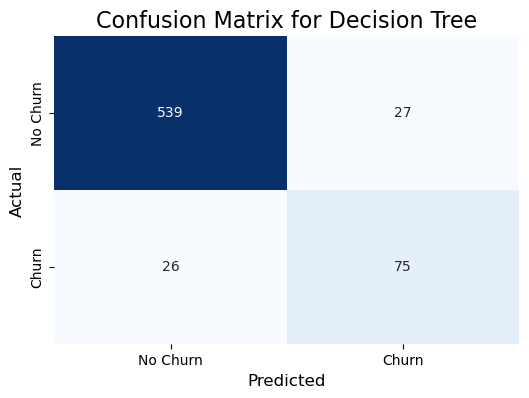

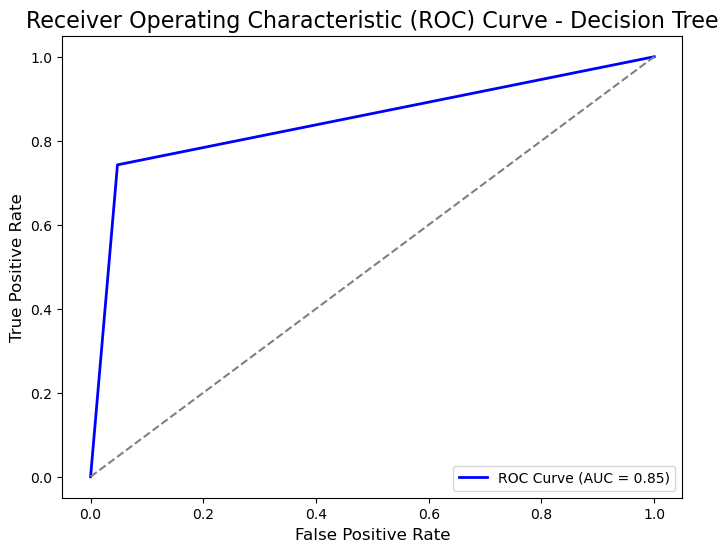

**Observations and Findings**

1. Decision Tree Accuracy: 0.92
   - The accuracy of the model is 92.05%, indicating how well the model is classifying both churned and non-churned customers.
2. Decision Tree Precision: 0.74
   - The precision of the model is 73.53%, which means that of all the customers predicted to churn, 73.53% actually did churn.
3. Decision Tree Recall: 0.74
   - The recall of the model is 74.26%, which means that 74.26% of actual churned customers were correctly identified by the model.
4. Decision Tree F1 Score: 0.74
   - The F1 score is 73.89%, indicating the balance between precision and recall.
5. Confusion Matrix: The confusion matrix reveals the following:
   - True Positives (TP): 75 - Churned customers correctly predicted.
   - True Negatives (TN): 539 - Non-churned customers correctly predicted.
   - False Positives (FP): 27 - Non-churned customers wrongly predicted as churned.
   - False Negatives (FN): 26 - Churned customers wrongly predicted as non-churned.
6. ROC Curve: The ROC curv

In [17]:
# Decision Tree Classifier (Basic Model)
dt = DecisionTreeClassifier(random_state=42)
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

# Evaluation Metrics
accuracy_dt = accuracy_score(y_test, y_pred_dt)
precision_dt = precision_score(y_test, y_pred_dt)
recall_dt = recall_score(y_test, y_pred_dt)  # Recall calculation
f1_dt = f1_score(y_test, y_pred_dt)          # F1-score calculation

# Print evaluation metrics and classification report
print(f"Decision Tree Accuracy: {accuracy_dt:.2f}")
print(f"Decision Tree Precision: {precision_dt:.2f}")
print(f"Decision Tree Recall: {recall_dt:.2f}")
print(f"Decision Tree F1 Score: {f1_dt:.2f}")
print(classification_report(y_test, y_pred_dt))

# Confusion Matrix
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_dt, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["No Churn", "Churn"], yticklabels=["No Churn", "Churn"])
plt.title("Confusion Matrix for Decision Tree", fontsize=16)
plt.xlabel("Predicted", fontsize=12)
plt.ylabel("Actual", fontsize=12)
plt.show()

# ROC Curve
fpr_dt, tpr_dt, _ = roc_curve(y_test, dt.predict_proba(X_test)[:, 1])
roc_auc_dt = auc(fpr_dt, tpr_dt)
plt.figure(figsize=(8, 6))
plt.plot(fpr_dt, tpr_dt, color="blue", lw=2, label=f"ROC Curve (AUC = {roc_auc_dt:.2f})")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("Receiver Operating Characteristic (ROC) Curve - Decision Tree", fontsize=16)
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right")
plt.show()

# Summary of Observations and Findings
display(Markdown("**Observations and Findings**"))
print(f"1. Decision Tree Accuracy: {accuracy_dt:.2f}")
print(f"   - The accuracy of the model is {accuracy_dt*100:.2f}%, indicating how well the model is classifying both churned and non-churned customers.")
print(f"2. Decision Tree Precision: {precision_dt:.2f}")
print(f"   - The precision of the model is {precision_dt*100:.2f}%, which means that of all the customers predicted to churn, {precision_dt*100:.2f}% actually did churn.")
print(f"3. Decision Tree Recall: {recall_dt:.2f}")
print(f"   - The recall of the model is {recall_dt*100:.2f}%, which means that {recall_dt*100:.2f}% of actual churned customers were correctly identified by the model.")
print(f"4. Decision Tree F1 Score: {f1_dt:.2f}")
print(f"   - The F1 score is {f1_dt*100:.2f}%, indicating the balance between precision and recall.")
print(f"5. Confusion Matrix: The confusion matrix reveals the following:")
print(f"   - True Positives (TP): {conf_matrix_dt[1, 1]} - Churned customers correctly predicted.")
print(f"   - True Negatives (TN): {conf_matrix_dt[0, 0]} - Non-churned customers correctly predicted.")
print(f"   - False Positives (FP): {conf_matrix_dt[0, 1]} - Non-churned customers wrongly predicted as churned.")
print(f"   - False Negatives (FN): {conf_matrix_dt[1, 0]} - Churned customers wrongly predicted as non-churned.")
print(f"6. ROC Curve: The ROC curve shows the trade-off between the true positive rate and the false positive rate.")
print(f"   - The AUC (Area Under the Curve) score is {roc_auc_dt:.2f}, indicating the model's ability to distinguish between the classes.")
print("   - An AUC score close to 1.0 indicates excellent model performance, while a score near 0.5 suggests random guessing.")

### 3. Third Model (Tuned Decision Tree Classifier)
- Tune the Decision Tree model using hyperparameter optimization using GridSearchCV.

Best Parameters: {'max_depth': 7, 'min_samples_leaf': 2, 'min_samples_split': 10}
Tuned Decision Tree Accuracy: 0.94
Tuned Decision Tree Precision: 0.88
Tuned Decision Tree Recall: 0.71
Tuned Decision Tree F1 Score: 0.79
              precision    recall  f1-score   support

           0       0.95      0.98      0.97       566
           1       0.88      0.71      0.79       101

    accuracy                           0.94       667
   macro avg       0.91      0.85      0.88       667
weighted avg       0.94      0.94      0.94       667



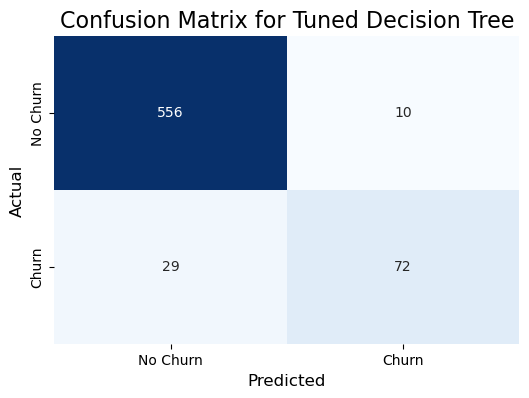

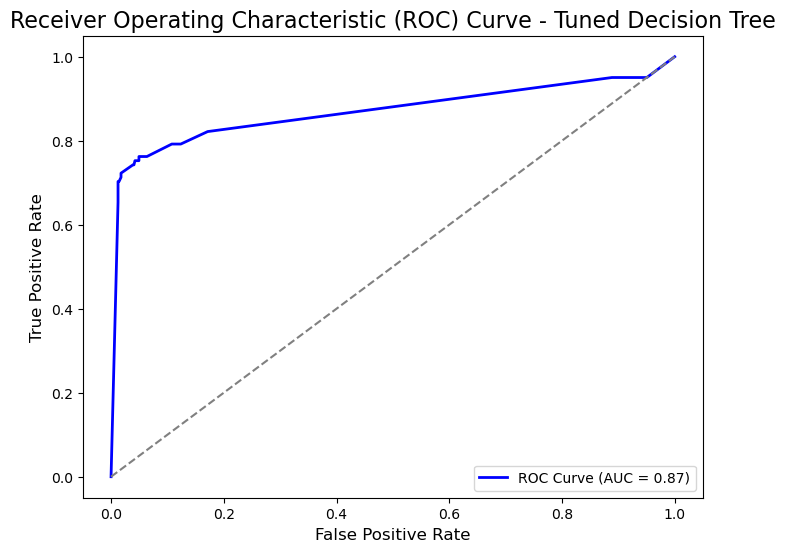

**Observations and Findings**

1. Tuned Decision Tree Accuracy: 0.94
   - The accuracy of the tuned model is 94.15%, showing improvement from the baseline.
2. Tuned Decision Tree Precision: 0.88
   - The precision of the tuned model is 87.80%, indicating better identification of churned customers compared to the baseline.
3. Tuned Decision Tree Recall: 0.71
   - The recall of the tuned model is 71.29%, which means that 71.29% of actual churned customers were correctly identified.
4. Tuned Decision Tree F1 Score: 0.79
   - The F1 score is 78.69%, indicating a better balance between precision and recall.
5. Confusion Matrix: The confusion matrix reveals the following:
   - True Positives (TP): 72 - Churned customers correctly predicted.
   - True Negatives (TN): 556 - Non-churned customers correctly predicted.
   - False Positives (FP): 10 - Non-churned customers wrongly predicted as churned.
   - False Negatives (FN): 29 - Churned customers wrongly predicted as non-churned.
6. ROC Curve: The ROC curve shows the trade

In [18]:
# Tuning Decision Tree Classifier using GridSearchCV
param_grid = {
    "max_depth": [3, 5, 7, 10],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4]
}

grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, n_jobs=-1, scoring="accuracy")
grid_search.fit(X_train, y_train)

# Best parameters from GridSearchCV
print(f"Best Parameters: {grid_search.best_params_}")

# Predict with the best model
y_pred_dt_tuned = grid_search.best_estimator_.predict(X_test)

# Evaluation Metrics
accuracy_dt_tuned = accuracy_score(y_test, y_pred_dt_tuned)
precision_dt_tuned = precision_score(y_test, y_pred_dt_tuned)
recall_dt_tuned = recall_score(y_test, y_pred_dt_tuned)  # Recall calculation
f1_dt_tuned = f1_score(y_test, y_pred_dt_tuned)          # F1-score calculation

# Print evaluation metrics and classification report
print(f"Tuned Decision Tree Accuracy: {accuracy_dt_tuned:.2f}")
print(f"Tuned Decision Tree Precision: {precision_dt_tuned:.2f}")
print(f"Tuned Decision Tree Recall: {recall_dt_tuned:.2f}")
print(f"Tuned Decision Tree F1 Score: {f1_dt_tuned:.2f}")
print(classification_report(y_test, y_pred_dt_tuned))

# Confusion Matrix
conf_matrix_dt_tuned = confusion_matrix(y_test, y_pred_dt_tuned)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix_dt_tuned, annot=True, fmt="d", cmap="Blues", cbar=False, xticklabels=["No Churn", "Churn"], yticklabels=["No Churn", "Churn"])
plt.title("Confusion Matrix for Tuned Decision Tree", fontsize=16)
plt.xlabel("Predicted", fontsize=12)
plt.ylabel("Actual", fontsize=12)
plt.show()

# ROC Curve
fpr_dt_tuned, tpr_dt_tuned, _ = roc_curve(y_test, grid_search.best_estimator_.predict_proba(X_test)[:, 1])
roc_auc_dt_tuned = auc(fpr_dt_tuned, tpr_dt_tuned)
plt.figure(figsize=(8, 6))
plt.plot(fpr_dt_tuned, tpr_dt_tuned, color="blue", lw=2, label=f"ROC Curve (AUC = {roc_auc_dt_tuned:.2f})")
plt.plot([0, 1], [0, 1], color="gray", linestyle="--")
plt.title("Receiver Operating Characteristic (ROC) Curve - Tuned Decision Tree", fontsize=16)
plt.xlabel("False Positive Rate", fontsize=12)
plt.ylabel("True Positive Rate", fontsize=12)
plt.legend(loc="lower right")
plt.show()

# Summary of Observations and Findings
display(Markdown("**Observations and Findings**"))
print(f"1. Tuned Decision Tree Accuracy: {accuracy_dt_tuned:.2f}")
print(f"   - The accuracy of the tuned model is {accuracy_dt_tuned*100:.2f}%, showing improvement from the baseline.")
print(f"2. Tuned Decision Tree Precision: {precision_dt_tuned:.2f}")
print(f"   - The precision of the tuned model is {precision_dt_tuned*100:.2f}%, indicating better identification of churned customers compared to the baseline.")
print(f"3. Tuned Decision Tree Recall: {recall_dt_tuned:.2f}")
print(f"   - The recall of the tuned model is {recall_dt_tuned*100:.2f}%, which means that {recall_dt_tuned*100:.2f}% of actual churned customers were correctly identified.")
print(f"4. Tuned Decision Tree F1 Score: {f1_dt_tuned:.2f}")
print(f"   - The F1 score is {f1_dt_tuned*100:.2f}%, indicating a better balance between precision and recall.")
print(f"5. Confusion Matrix: The confusion matrix reveals the following:")
print(f"   - True Positives (TP): {conf_matrix_dt_tuned[1, 1]} - Churned customers correctly predicted.")
print(f"   - True Negatives (TN): {conf_matrix_dt_tuned[0, 0]} - Non-churned customers correctly predicted.")
print(f"   - False Positives (FP): {conf_matrix_dt_tuned[0, 1]} - Non-churned customers wrongly predicted as churned.")
print(f"   - False Negatives (FN): {conf_matrix_dt_tuned[1, 0]} - Churned customers wrongly predicted as non-churned.")
print(f"6. ROC Curve: The ROC curve shows the trade-off between the true positive rate and the false positive rate.")
print(f"   - The AUC (Area Under the Curve) score is {roc_auc_dt_tuned:.2f}, indicating the model's improved ability to distinguish between churned and non-churned customers.")
print("   - A higher AUC value indicates that the model is better at making distinctions.")

## EVALUATION
- Evaluate the model based on **Accuracy**, **Precision**, **Recall** and **F1 Score**.

In [19]:
# Comparison of all models
models = {
    "Logistic Regression": {
        "Accuracy": accuracy_logreg, 
        "Precision": precision_logreg,
        "Recall": recall_logreg,
        "F1 Score": f1_logreg
    },
    "Decision Tree (Basic)": {
        "Accuracy": accuracy_dt, 
        "Precision": precision_dt,
        "Recall": recall_dt,
        "F1 Score": f1_dt
    },
    "Tuned Decision Tree": {
        "Accuracy": accuracy_dt_tuned, 
        "Precision": precision_dt_tuned,
        "Recall": recall_dt_tuned,
        "F1 Score": f1_dt_tuned
    }
}

# Convert to DataFrame for easy comparison
model_comparison = pd.DataFrame(models).T
print(model_comparison.sort_values(by="Accuracy", ascending=False))

                       Accuracy  Precision    Recall  F1 Score
Tuned Decision Tree    0.941529   0.878049  0.712871  0.786885
Decision Tree (Basic)  0.920540   0.735294  0.742574  0.738916
Logistic Regression    0.857571   0.583333  0.207921  0.306569


## FINDINGS
### 1. Tuned Decision Tree:

   - **Accuracy:** 94.15%
   - **Precision:** 87.80%
   - **Recall:** 71.29%
   - **F1 Score:** 78.69%
  - This model performed the best among the three, achieving both the highest accuracy and precision scores, making it the most reliable option for predicting churn. The hyperparameter tuning significantly enhanced the model's performance.
### 2. Basic Decision Tree:

   - **Accuracy:** 92.05%
   - **Precision:** 73.53%
   - **Recall:** 74.26%
   - **F1 Score:** 73.89%
  - While this model provided a good accuracy score, its precision was lower, indicating it may produce more false positives compared to the tuned version.
### 3. Logistic Regression:

   - **Accuracy:** 85.76%
   - **Precision:** 58.33%
   - **Recall:** 20.79%
   - **F1 Score:** 30.66%
  - The baseline model (Logistic Regression) showed the lowest performance in both accuracy and precision, indicating limited ability to effectively distinguish between churned and non-churned customers.
## CONCLUSIONS
1. The **Tuned Decision Tree** is the most suitable model for this project, as it met and exceeded the success criteria (accuracy ≥ 85%, precision ≥ 80%). This model is robust and can effectively predict customer churn while minimizing false positives.
2. The **Basic Decision Tree** performed well in accuracy but fell short on precision, showing that hyperparameter tuning plays a crucial role in improving model performance.
3. The **Logistic Regression** model is unsuitable for deployment due to its significantly lower precision, meaning it might misclassify too many customers as churned, leading to inefficient allocation of retention efforts.
## RECOMMENDATIONS
### 1. Business Actions:

   - Focus on the **high-risk** customers identified by the Tuned Decision Tree model.
   - Develop personalized retention strategies, such as special offers, discounts, or enhanced customer support, for customers predicted to churn.
   - Leverage the model's insights to identify factors that most contribute to churn and address these proactively (e.g., improving services associated with high churn probability).
### 2. Model Improvement:

   - Explore additional advanced models, such as **Random Forest** or **XGBoost**, to potentially achieve even better accuracy and precision.
   - Experiment with **ensemble techniques** to combine multiple models for more robust predictions.
### 3. Data Enhancements:

   - Collect more features related to customer behavior, such as usage patterns, customer support interactions, or product feedback, to improve predictive power.
   - Address potential class imbalance (if present) by using techniques like SMOTE (Synthetic Minority Oversampling) to improve model performance further.
### 4. Monitoring and Maintenance:

   - Implement a model monitoring system to ensure that the deployed model maintains its performance over time.
   - Periodically retrain the model with new data to adapt to changing customer behavior and market conditions.
## NEXT STEPS
### 1. Deployment:
  
   - Deploy the **Tuned Decision Tree** model into production. Integrate it into the company’s CRM system to make real-time churn predictions and prioritize retention efforts.
   - Ensure the model is accessible to relevant stakeholders via a user-friendly interface or dashboard.
### 2. Real-Time Integration:

   - Build an **ETL pipeline** to automatically collect and preprocess new customer data for churn prediction.
   - Automate the prediction process to provide actionable insights on a daily or weekly basis.
### 3. Continuous Improvement:

   - Monitor model performance using metrics such as accuracy, precision, recall, and F1-score over time.
   - Collect more data, including new features that may influence churn (e.g., customer satisfaction scores, complaint data).
   - Develop A/B testing strategies to assess the effectiveness of retention campaigns based on churn predictions.
### 4. Expanding the Use Case:

   - Extend the model’s application beyond churn prediction by analyzing customer lifetime value (CLV) to optimize resource allocation further.
   - Use the insights for targeted marketing campaigns to attract new customers with similar profiles to non-churned customers.